<div style="background-color: #FDF1F1; padding: 30px; border-radius: 20px; border: 2px solid #B03A5B; box-shadow: 5px 5px 15px #888888; text-align: center;">
  <h1 style="color: #B03A5B; font-family: 'Arial', sans-serif; font-size: 28px; font-weight: bold;">
    Credit Card Fraud Detection
  </h1>
  <p style="color: #B03A5B; font-size: 16px; font-style: italic;">
    (some analysis and geting informations)
  </p>
  <h2 style="color: #B03A5B; font-family: 'Arial', sans-serif; font-size: 28px; font-weight: bold;">
    About The Data💳
  </h2>
</div>


# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">Time: </span>  
   - Represents the elapsed time (in seconds) since the first transaction in the dataset.  
   - Useful for identifying patterns based on transaction time and detecting anomalies.  

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">V1 - V28 Features: </span>  
   - Anonymized numerical features derived from Principal Component Analysis (PCA).  
   - These features help in detecting hidden patterns that might indicate fraudulent transactions.  

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">Amount: </span>  
   - Represents the monetary value of the transaction.  
   - Helps in analyzing spending behavior and identifying unusual transaction amounts.  

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">Class: </span>  
   - Indicates whether the transaction is fraudulent (1) or legitimate (0).  
   - This is the target variable for fraud detection models.  

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">✔ Analyzing these features together enables the detection of fraudulent transactions by uncovering anomalies and suspicious spending behaviors. </span>  

<div style="background-color: #4b3832; padding: 20px; border-radius: 10px; box-shadow: 5px 5px 10px #888888;">
  <h1 style="color: white; font-size: 30px; font-weight: bold; text-align: center; text-shadow: 2px 2px 4px #000000;">import the needed libraries😉</h1>
</div>

In [33]:
# 1. to handle the data
import pandas as pd
import numpy as np

# 2. To Viusalize the data
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.decomposition import PCA
from plotly.offline import iplot, plot
from plotly.subplots import make_subplots

# 3. Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# 4. My colors
colors = ["#b1e7cd","#854442","#000000","#fff4e6","#3c2f2f",
           "#be9b7b ","#512E5F","#45B39D","#AAB7B8 ","#20B2AA",
           "#FF69B4","#00CED1","#FF7F50","#7FFF00","#DA70D6"]

<div style="background-color: #4b3832; padding: 20px; border-radius: 10px; box-shadow: 5px 5px 10px #888888;">
  <h1 style="color: white; font-size: 30px; font-weight: bold; text-align: center; text-shadow: 2px 2px 4px #000000;">first we load the data and get some info✌️</h1>
</div>

In [34]:
train = pd.read_csv(r"D:\Ai courses\ML mostafa saad\projects\Credit Card Fraud Detection\train.csv")
val = pd.read_csv(r"D:\Ai courses\ML mostafa saad\projects\Credit Card Fraud Detection\val.csv")

In [35]:
# GET NUM OF COLOMS AND ROWS
print(f"Number of column of the train data :{train.shape[1]}\nNumber of rows of train data :{train.shape[0]}")
print("_"* 60)
print(f"\nNumber of column of the validation data :{val.shape[1]}\nNumber of rows of validation data :{val.shape[0]}")

Number of column of the train data :31
Number of rows of train data :170884
____________________________________________________________

Number of column of the validation data :31
Number of rows of validation data :56960


In [36]:
# concat the data sets to start
df = pd.concat([train,val],axis=0)

# print the head of the data
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,119191.0,2.052427,-0.133236,-1.740621,0.277935,0.337999,-0.826933,0.334629,-0.227039,0.267655,...,-0.006518,0.121300,0.037733,-0.356498,0.147822,0.569149,-0.103929,-0.091958,8.73,0
1,71750.0,1.220356,-0.159191,-0.444349,-0.094437,0.104457,-0.345790,0.170867,-0.094996,0.187572,...,-0.088775,-0.364654,-0.140851,-0.707308,0.415661,1.087767,-0.102532,-0.008335,59.95,0
2,151977.0,0.892824,-1.440698,-0.637940,3.912871,0.099291,2.433288,-0.308891,0.603227,-0.113826,...,0.484969,0.487304,-0.122694,-0.598803,-0.594563,0.062841,-0.033426,0.038254,460.65,0
3,55709.0,-3.146021,2.247634,0.901397,0.146162,-2.109360,-0.148312,-1.533191,2.073663,0.499394,...,0.050567,-0.037019,0.107000,0.392857,0.303597,0.379544,-0.148990,0.074965,4.78,0
4,66654.0,1.194996,-0.007495,0.301285,0.750199,-0.297494,-0.405836,0.060410,-0.150482,0.400860,...,-0.234931,-0.545566,-0.089418,-0.064036,0.527305,0.294221,-0.025980,0.015637,44.31,0


In [37]:
# GET NUM OF COLOMS AND ROWS
print(f"Number of column :{df.shape[1]}\nNumber of rows :{df.shape[0]}")

Number of column :31
Number of rows :227844


In [38]:
# GET THE INFO 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 227844 entries, 0 to 56959
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    227844 non-null  float64
 1   V1      227844 non-null  float64
 2   V2      227844 non-null  float64
 3   V3      227844 non-null  float64
 4   V4      227844 non-null  float64
 5   V5      227844 non-null  float64
 6   V6      227844 non-null  float64
 7   V7      227844 non-null  float64
 8   V8      227844 non-null  float64
 9   V9      227844 non-null  float64
 10  V10     227844 non-null  float64
 11  V11     227844 non-null  float64
 12  V12     227844 non-null  float64
 13  V13     227844 non-null  float64
 14  V14     227844 non-null  float64
 15  V15     227844 non-null  float64
 16  V16     227844 non-null  float64
 17  V17     227844 non-null  float64
 18  V18     227844 non-null  float64
 19  V19     227844 non-null  float64
 20  V20     227844 non-null  float64
 21  V21     227

In [7]:
pd.DataFrame({'count': df.shape[0], 
              'nulls': df.isnull().sum(), 
              'nulls%': df.isnull().mean() * 100, 
              'cardinality': df.nunique(),
             })

,count,nulls,nulls%,cardinality
Time,227844,0,0.0,114068
V1,227844,0,0.0,221438
V2,227844,0,0.0,221438
V3,227844,0,0.0,221438
V4,227844,0,0.0,221438
V5,227844,0,0.0,221438
V6,227844,0,0.0,221438
V7,227844,0,0.0,221438
V8,227844,0,0.0,221438
V9,227844,0,0.0,221438


In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Time,227844.0,94879.276847,47490.535341,0.000000,54255.000000,84798.000000,139400.250000,172792.000000
V1,227844.0,0.001258,1.951401,-46.855047,-0.920866,0.018912,1.316935,2.451888
V2,227844.0,0.001685,1.640594,-63.344698,-0.599431,0.066723,0.804362,22.057729
V3,227844.0,-0.000992,1.514788,-48.325589,-0.894470,0.178947,1.027689,4.226108
V4,227844.0,-0.002404,1.416094,-5.683171,-0.850394,-0.022542,0.741018,16.875344
V5,227844.0,0.001006,1.383398,-113.743307,-0.690910,-0.053822,0.612739,34.099309
V6,227844.0,-0.000632,1.335108,-23.496714,-0.770169,-0.276473,0.398012,73.301626
V7,227844.0,-0.002497,1.241308,-43.557242,-0.555219,0.039672,0.569158,120.589494
V8,227844.0,-0.001477,1.207911,-73.216718,-0.209360,0.022061,0.327421,20.007208
V9,227844.0,0.000526,1.097383,-13.434066,-0.641322,-0.051299,0.596857,10.392889


<div style="background-color: #4b3832; padding: 20px; border-radius: 10px; box-shadow: 5px 5px 10px #888888;">
  <h1 style="color: white; font-size: 30px; font-weight: bold; text-align: center; text-shadow: 2px 2px 4px #000000;">Feature Engineering✌️</h1>
</div>

In [39]:
# Convert 'Time' from seconds to hours and day
df['Hours'] = (df['Time'] // 3600) % 24
df["Day"] = (df["Time"] // (3600 * 24)) % 7


# Drop original 'Time' column (optional)
df.drop(columns=["Time"], inplace=True)


In [40]:
df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V23,V24,V25,V26,V27,V28,Amount,Class,Hours,Day
0,2.052427,-0.133236,-1.740621,0.277935,0.337999,-0.826933,0.334629,-0.227039,0.267655,0.293539,...,0.037733,-0.356498,0.147822,0.569149,-0.103929,-0.091958,8.73,0,9.0,1.0
1,1.220356,-0.159191,-0.444349,-0.094437,0.104457,-0.345790,0.170867,-0.094996,0.187572,-0.143353,...,-0.140851,-0.707308,0.415661,1.087767,-0.102532,-0.008335,59.95,0,19.0,0.0
2,0.892824,-1.440698,-0.637940,3.912871,0.099291,2.433288,-0.308891,0.603227,-0.113826,1.057386,...,-0.122694,-0.598803,-0.594563,0.062841,-0.033426,0.038254,460.65,0,18.0,1.0
3,-3.146021,2.247634,0.901397,0.146162,-2.109360,-0.148312,-1.533191,2.073663,0.499394,-0.363315,...,0.107000,0.392857,0.303597,0.379544,-0.148990,0.074965,4.78,0,15.0,0.0
4,1.194996,-0.007495,0.301285,0.750199,-0.297494,-0.405836,0.060410,-0.150482,0.400860,-0.228237,...,-0.089418,-0.064036,0.527305,0.294221,-0.025980,0.015637,44.31,0,18.0,0.0


In [41]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
V1,227844.0,0.001258,1.951401,-46.855047,-0.920866,0.018912,1.316935,2.451888
V2,227844.0,0.001685,1.640594,-63.344698,-0.599431,0.066723,0.804362,22.057729
V3,227844.0,-0.000992,1.514788,-48.325589,-0.894470,0.178947,1.027689,4.226108
V4,227844.0,-0.002404,1.416094,-5.683171,-0.850394,-0.022542,0.741018,16.875344
V5,227844.0,0.001006,1.383398,-113.743307,-0.690910,-0.053822,0.612739,34.099309
V6,227844.0,-0.000632,1.335108,-23.496714,-0.770169,-0.276473,0.398012,73.301626
V7,227844.0,-0.002497,1.241308,-43.557242,-0.555219,0.039672,0.569158,120.589494
V8,227844.0,-0.001477,1.207911,-73.216718,-0.209360,0.022061,0.327421,20.007208
V9,227844.0,0.000526,1.097383,-13.434066,-0.641322,-0.051299,0.596857,10.392889
V10,227844.0,-0.000748,1.085515,-24.588262,-0.536891,-0.093708,0.453880,15.331742


<div style="background-color: #4b3832; padding: 20px; border-radius: 10px; box-shadow: 5px 5px 10px #888888;">
  <h1 style="color: white; font-size: 30px; font-weight: bold; text-align: center; text-shadow: 2px 2px 4px #000000;">Let's do some visualization 📈</h1>
</div>

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">1. The Known Columns</span>

In [42]:
col_to_vis = ['Amount','Hours','Day']
for i in col_to_vis:
  #Let's make a subplot to the bmi column 
  fig = make_subplots(rows=1, cols=2, subplot_titles=[f"{i} Distribution (Box Plot)", "{i} Distribution (Histogram)"])

  fig.add_trace(
    go.Box(y=df[i], name="Box Plot", marker_color=colors[9]),
    row=1, col=1
  )

  fig.add_trace(
    go.Histogram(x=df[i], nbinsx=20, name="Histogram", marker_color=colors[10]),
    row=1, col=2
  )

  fig.update_layout(
    title=f"{i} Distribution: Box Plot and Histogram",
    template="plotly_dark",
    showlegend=False
  )

  fig.update_xaxes(title_text=f"{i} (Histogram)", row=1, col=2)
  fig.update_yaxes(title_text="Count (Histogram)", row=1, col=2)
  fig.update_yaxes(title_text="{i} (Box Plot)", row=1, col=1)

  fig.show()

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">💰 Amount Distribution Analysis: </span>
### 📊 Box Plot Insights:
- The **box plot** of transaction amounts shows that most transactions are **clustered around low values**.
- There are several **extreme outliers**, indicating that a few transactions have **significantly higher amounts**.
- This suggests a **right-skewed distribution**, meaning most transactions are small, with a few large ones.

### 📉 Histogram Insights:
- The **histogram** confirms that the vast majority of transactions have **low amounts**.
- There are very few **high-amount transactions**, as seen from the **low bar heights on the right side**.
- This distribution pattern is **typical for financial transactions**, where most payments are small, and large payments are rare.

---

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">⏳ Hours Distribution Analysis: </span>
### 📊 Box Plot Insights:
- The **interquartile range (IQR)** of transactions is **relatively wide**, spanning from approximately **5 to 20 hours**.
- Transactions occur **throughout the day**, with a **median transaction time around 15-16 hours**.
- There are **no extreme outliers**, indicating a **balanced distribution** of transactions across different hours.

### 📉 Histogram Insights:
- The **histogram** displays a **relatively uniform distribution** of transactions across different hours of the day.
- Certain **hours have more transactions**, possibly indicating **peak transaction times**.
- This suggests that transactions occur **continuously throughout the day**, without a **strong concentration** at a specific time.

---

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">📅 Day Distribution Analysis: </span>
### 📊 Box Plot Insights:
- The **box plot** suggests that transactions are **evenly distributed** across the available day categories **(0 and 1)**.
- This implies that transactions occur **across multiple days** rather than being concentrated on one.

### 📉 Histogram Insights:
- The **histogram** reveals that transactions are **almost evenly split** between two categories.
- This might indicate that the dataset covers **transactions from two specific days** or represents **weekdays vs. weekends**.
- The **uniform distribution** suggests there is **no major difference** in transaction frequency between the two days.

---

In [43]:
# Count the classes
count_class = df['Class'].value_counts()

# Create subplots
fig = make_subplots(
    rows=1, cols=2, 
    subplot_titles=["Class Distribution (Pie)", "Class Distribution (Bar)"],
    specs=[[{"type": "domain"}, {"type": "xy"}]]
)

# Add pie chart
fig.add_trace(
    go.Pie(labels=count_class.index, values=count_class.values, name="Pie"),
    row=1, col=1
)

# Add bar chart
fig.add_trace(
    go.Bar(x=count_class.index, y=count_class.values, name="Bar"),
    row=1, col=2
)

# Update layout
fig.update_layout(
    title="Class Distribution: Pie and Bar",
    template="plotly_dark",
    showlegend=True
)

# Show the figure
fig.show()

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">📊 Class Distribution Analysis: </span>

### 🔹 Pie Chart Insights:
- The **pie chart** shows that the dataset is **highly imbalanced**.
- The majority class (**non-fraudulent transactions**) makes up **99.8%** of the data.
- Fraudulent transactions constitute only **0.2%**, highlighting a significant class imbalance.
- This imbalance suggests the need for **resampling techniques** or **specialized evaluation metrics** when building models.

### 🔸 Bar Chart Insights:
- The **bar chart** further reinforces the dominance of the **majority class (0)**.
- The fraudulent class (1) is barely visible in the visualization, emphasizing the severe imbalance.
- Techniques like **SMOTE, undersampling, or anomaly detection** may be needed to improve fraud detection performance.

---


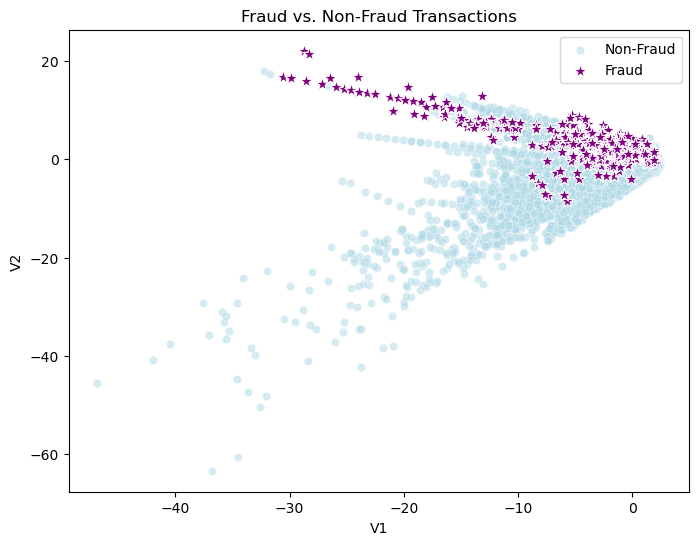

In [44]:
# Assuming df is your dataset, and 'V1' and 'V2' are any two features
plt.figure(figsize=(8, 6))

# Plot non-fraud transactions
sns.scatterplot(data=df[df['Class'] == 0], x='V1', y='V2', color='lightblue', alpha=0.5, label='Non-Fraud')

# Overlay fraud transactions with a distinct marker
sns.scatterplot(data=df[df['Class'] == 1], x='V1', y='V2', color='purple', marker='*', s=100, label='Fraud')

plt.xlabel('V1')
plt.ylabel('V2')
plt.title('Fraud vs. Non-Fraud Transactions')
plt.legend()
plt.show()

### <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">2. The Unknown Columns  </span>

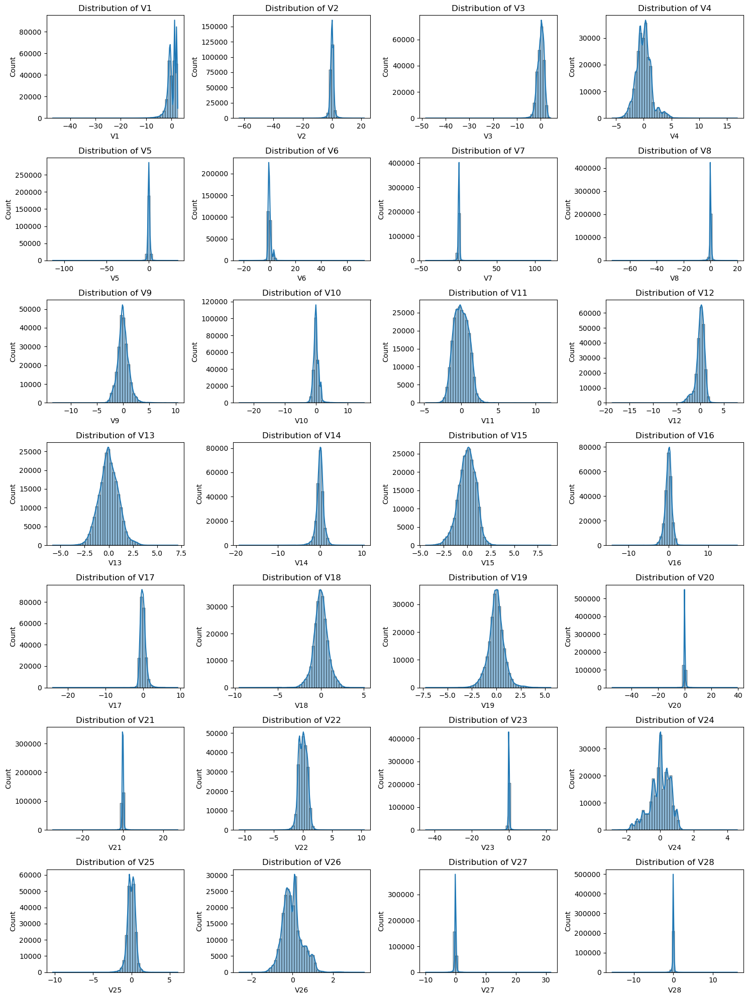

In [45]:
# Define number of rows and columns for subplots
fig, axes = plt.subplots(7, 4, figsize=(15, 20))  
axes = axes.flatten() 

# Loop through 28 numeric columns
for i, col in enumerate(df.columns[:28]): 
    sns.histplot(df[col], kde=True, bins=50, ax=axes[i])
    axes[i].set_title(f"Distribution of {col}")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Count')

plt.tight_layout()
plt.show()

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">📊 Feature Distribution Analysis: </span>

### 🔹 Insights from Histograms:
- Each feature follows a distinct distribution, with many showing a **Gaussian-like shape**.
- Some features are **highly skewed**, indicating the presence of extreme values or outliers.
- Several features have a **strong peak near zero**, suggesting their values are centered around small ranges.
- A few features exhibit **wider distributions**, potentially contributing more variance to the dataset.

### 🔸 Key Observations:
- Most features appear **standardized**, as their values range around **zero with small variations**.
- Certain features display **long tails**, which could indicate rare but important transaction behaviors.
- The **distribution patterns** help in understanding data scaling and selecting appropriate preprocessing techniques.
- **Feature selection and transformation** may be required for optimizing fraud detection models.

---


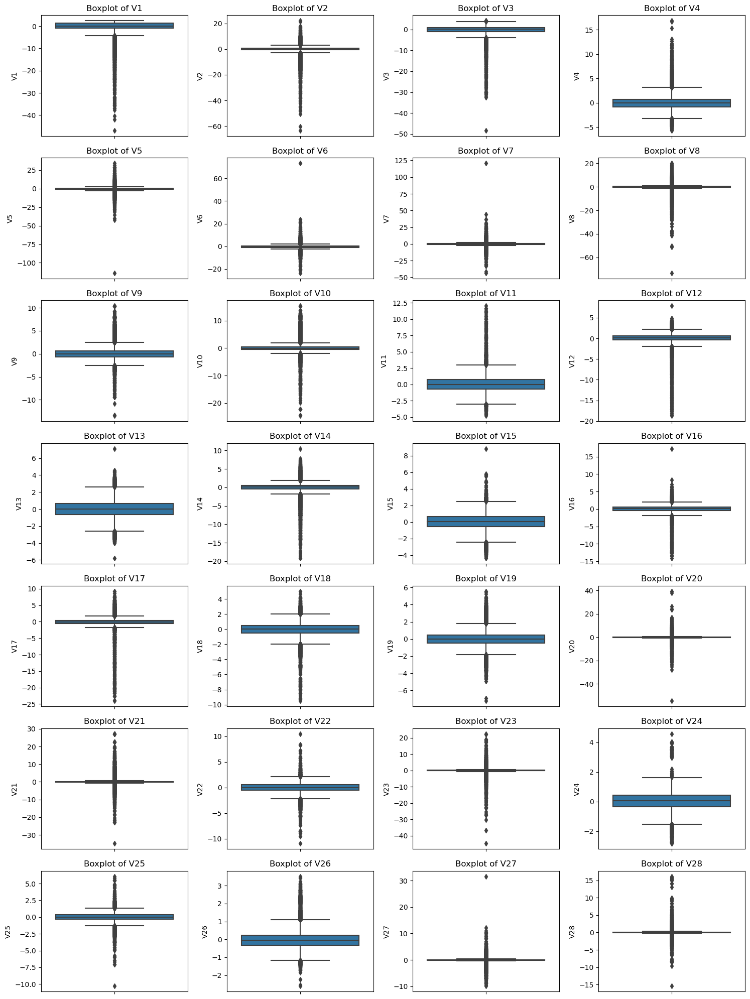

In [15]:
# Define number of rows and columns for subplots
fig, axes = plt.subplots(7, 4, figsize=(15, 20))  
axes = axes.flatten()  

# Loop through 28 numeric columns
for i, col in enumerate(df.columns[:28]): 
    sns.boxplot(y=df[col], ax=axes[i]) 
    axes[i].set_title(f"Boxplot of {col}")

plt.tight_layout()
plt.show()

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">📦 Feature Box Plot Analysis: </span>

### 🔹 Insights from Box Plots:
- Many features have a **wide interquartile range (IQR)**, indicating a high variance in transaction values.
- A significant number of **outliers** are present in most features, suggesting rare but extreme transaction patterns.
- Some features show a **more symmetrical spread**, while others exhibit skewness, indicating potential biases in the data.

### 🔸 Key Observations:
- **Presence of outliers** may impact model performance and require appropriate handling (e.g., clipping or transformation).
- **IQR variability** across features suggests some variables may be more informative for anomaly detection.
- Certain features have a **centralized distribution**, while others have **long-tailed distributions**, affecting how they contribute to fraud classification.
- Understanding these patterns is crucial for **feature scaling, normalization, and fraud detection strategy**.

---


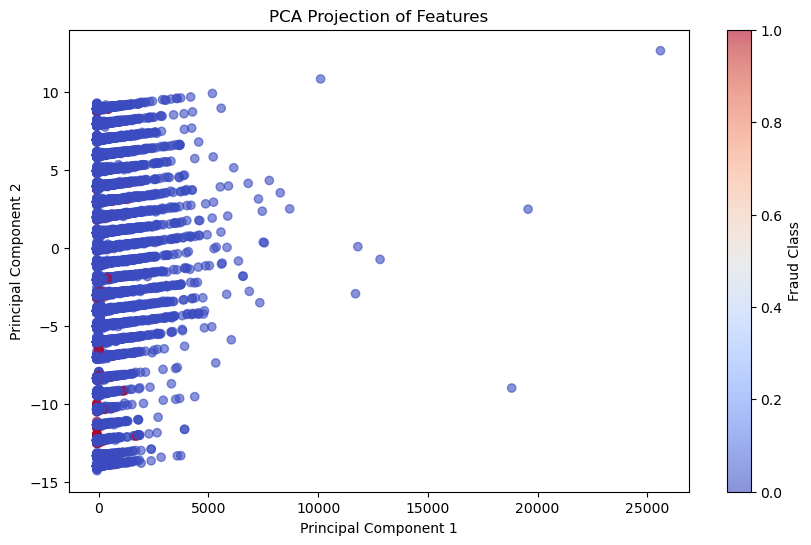

In [25]:
pca = PCA(n_components=2)  # Reduce to 2D
X_pca = pca.fit_transform(df.drop(columns=['Class'], errors='ignore'))

plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=df['Class'], cmap='coolwarm', alpha=0.6)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Projection of Features")
plt.colorbar(label="Fraud Class")
plt.show()

In [16]:
# Lets do our best
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Define outliers as points outside 1.5 * IQR range
outliers = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).sum()

outlier_percentage = (outliers / len(df)) * 100

from scipy.stats import skew

# Compute skewness for each numeric column
skewness = df.skew()

# Combine both results into a DataFrame
outlier_summary = pd.DataFrame({'Outlier Count': outliers, 'Outlier %': outlier_percentage, 'skewness':skewness})

# Sort by most affected features
outlier_summary = outlier_summary.sort_values(by='Outlier Count', ascending=False)

print(outlier_summary)


        Outlier Count  Outlier %   skewness
V27             31246  13.713769   0.103669
Amount          25391  11.144028  18.231235
V28             24145  10.597163   4.856499
V20             22222   9.753164  -1.942250
V8              19417   8.522059  -8.790797
V6              18427   8.087551   1.983548
V23             14813   6.501378  -6.763115
V12             12382   5.434420  -2.282818
V21             11654   5.114903   3.538366
V14             11294   4.956900  -1.960619
V2              10785   4.733502  -4.425369
V5               9840   4.318744  -2.967412
V4               8983   3.942610   0.669838
V19              8195   3.596759   0.105691
V10              7543   3.310598   1.129756
V7               7151   3.138551   3.290903
V9               6636   2.912519   0.542773
V16              6564   2.880919  -1.098399
V18              6086   2.671126  -0.258290
V17              5923   2.599586  -3.821741
V1               5657   2.482839  -3.168147
V26              4444   1.950457

# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">⚡ Possible Actions Based on Results: </span>

### 🔹 Handling Outliers:  
- **Highly affected features (e.g., V27, Amount, V28, V20, V8, V6)**  
  - Use **clipping** to limit extreme values without losing important information.  
  - Apply **log transformation** to handle extreme skewness (especially for Amount and V28).  
  - Consider **removing outliers** if they are noise and do not contribute to model learning.  

---

### 🔸 Addressing Skewness:  
- **Features with extreme skew (e.g., Amount, V28, V23, V8, Class)**  
  - Normalize distributions using **log, square root, or Box-Cox transformations**.  
  - Implement **Min-Max Scaling or Standardization** to improve model performance.  

---

### 🔹 Feature Engineering Strategies:  
- **Feature Selection:**  
  - Assess whether highly skewed or outlier-prone features are adding noise or value.  
  - Utilize **Principal Component Analysis (PCA)** to reduce dimensionality if needed.  


- **Binning Techniques:**  
  - Convert continuous variables (e.g., Amount, V20) into **categorical bins** to minimize outlier influence.  

---

### 🔸 Model Considerations:  
- **Use Robust Models:**  
  - **Tree-based models (e.g., XGBoost, Random Forest)** handle outliers better.  
  - For linear models, try **Huber Regression or Ridge Regression** to reduce sensitivity to extreme values.  



- **Resampling Strategies:**  
  - If class imbalance is detected, apply **SMOTE or undersampling** to create a balanced dataset.  

---

### 🔹 Further Investigation:  
- **Domain-Specific Analysis:**  
  - Determine if extreme values correspond to **legitimate rare events or fraudulent activities**.  
  - Examine **time-based trends (e.g., Hours, Day)** to identify patterns in anomalies.  



By implementing these strategies, we can **improve model robustness, enhance predictive performance, and minimize bias from extreme values**. 🚀  

---

### <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">3. The Correlation Matrics </span>

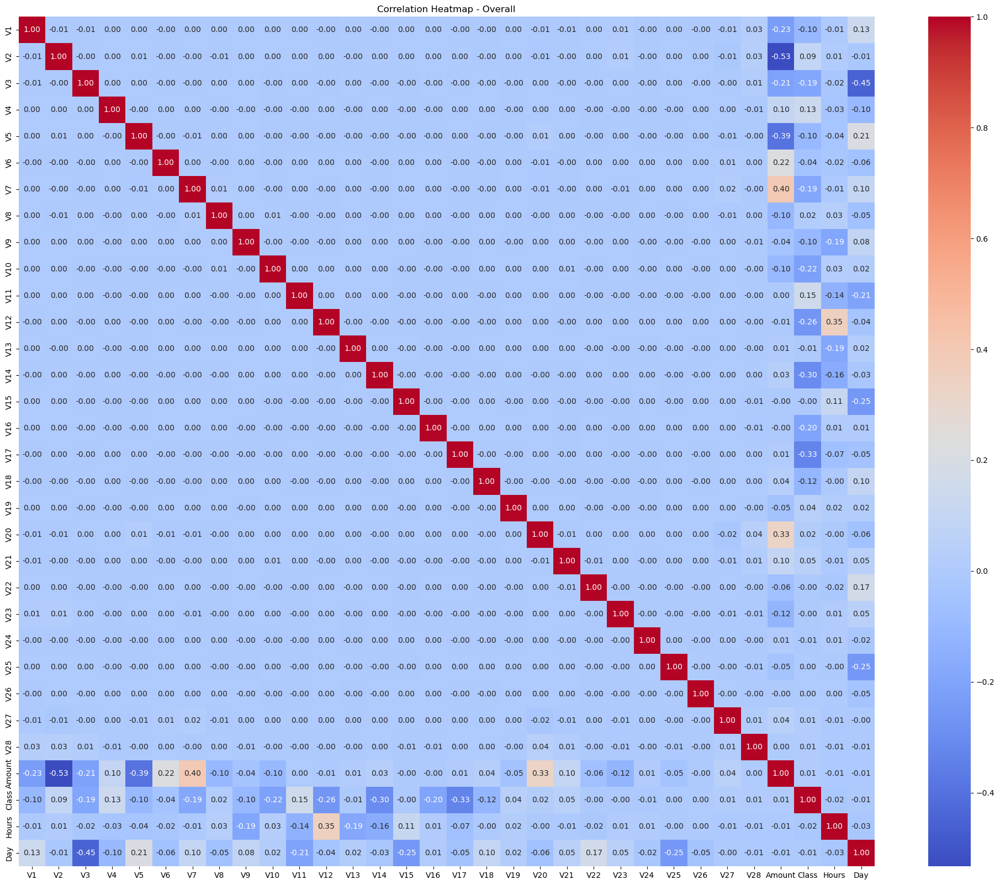

In [22]:
corr_matrix = df.corr()

# Reduce redundant heatmaps or provide deeper insights per plot
plt.figure(figsize=(25, 20))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap - Overall")
plt.show()

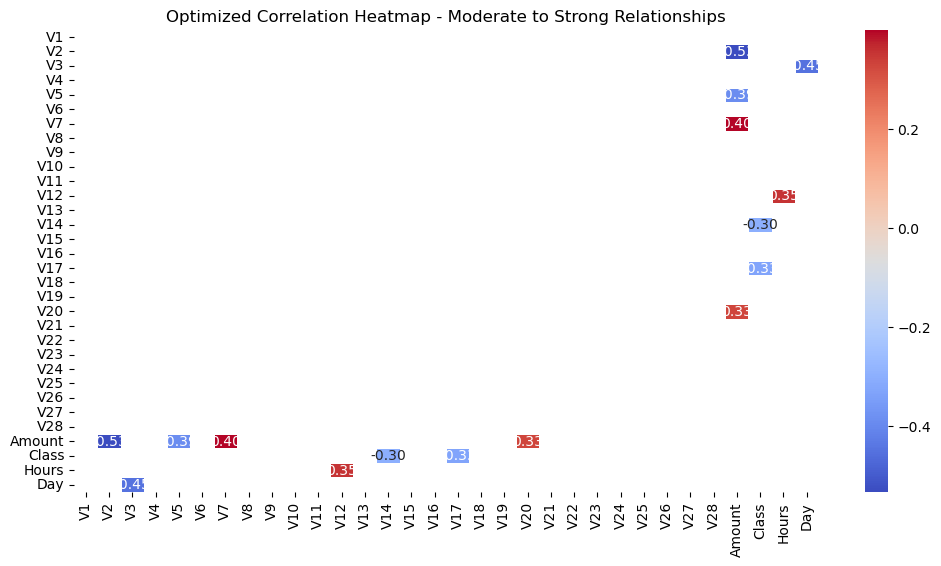

In [24]:
# Remove self-correlations
strong_corr = corr_matrix.copy()
for col in strong_corr.columns:
    strong_corr.loc[col, col] = 0  

# Use a lower threshold for correlation 
strong_corr = strong_corr[(strong_corr > 0.3) | (strong_corr < -0.3)]

# Plot the heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(strong_corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Optimized Correlation Heatmap - Moderate to Strong Relationships")
plt.show()


# <span style="color:rgb(102, 133, 190); font-size: 24px; font-weight: bold;">🔗 Optimized Correlation Heatmap Analysis:</span>

### 🔹 Key Insights from the Correlation Heatmap:
- **Moderate to strong correlations** observed between some features, indicating possible relationships in the dataset.
- Features with **higher correlations** may contribute significantly to fraud detection, while weakly correlated features might have less impact.
- Some negative correlations suggest **inverse relationships**, which could be crucial in anomaly detection.

### 🔸 Possible Actions Based on Results:
- **Feature Selection & Engineering:**
  - Highly correlated features might be **redundant**, leading to multicollinearity—consider dimensionality reduction techniques like **PCA**.
  - Features with strong correlations to **Class (Fraud/Not Fraud)** should be prioritized for model training.
  
- **Data Preprocessing:**
  - If certain features have near-zero correlation with the target variable, they could be **dropped** to reduce noise.
  - Consider normalizing or transforming features with extreme correlation values to enhance model interpretability.

- **Model Optimization:**
  - Use feature importance analysis from tree-based models (e.g., **Random Forest, XGBoost**) to validate the impact of correlated variables.
  - Try techniques like **Regularization (L1/L2 penalties)** to handle multicollinearity.

- **Anomaly Detection Strategy:**
  - Features showing distinct correlation patterns could be used to develop **custom fraud detection rules**.
  - Investigate why certain features show **unexpected correlations**, as they might indicate hidden patterns in fraudulent transactions.



<div style="background-color:#4b3832; padding: 20px; border-radius: 10px; box-shadow: 5px 5px 10px #888888;">
  <h1 style="color: #ECF0F1; font-size: 30px; font-weight: bold; text-align: center; text-shadow: 2px 2px 4px #000000;">
    Thank you 😍
  </h1>
</div>
